<a href="https://colab.research.google.com/github/MennaAlaa49/Dental-Instance-Segmentation/blob/main/Dental_Instance_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import os
home = os.getcwd()
print(home)

/content


# ***Important libraries***

In [2]:
!pip install ultralytics

from IPython import display

import ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.2/663.2 kB 9.1 MB/s eta 0:00:00


In [3]:
from ultralytics import YOLO

from IPython.display import display, Image

# ***Loading Data from roboflow***

In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="FRrBY1Tej2XugZN4YwId")
project = rf.workspace("bassem-ahmed-ouwsa").project("dentistry-vbril")
dataset = project.version(2).download("yolov8")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.0/69.0 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.9 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninsta

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.230, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Dentistry-2 in yolov8:: 100%|██████████| 1139/1139 [00:00<00:00, 9936.21it/s] 


# ***Data Visualization***

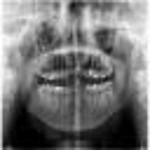

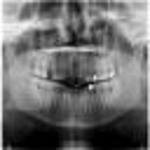

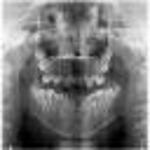

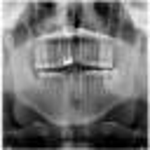

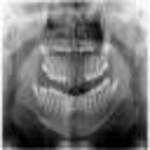

...

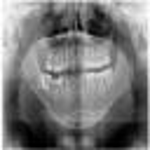

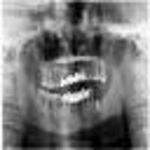

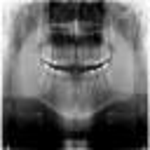

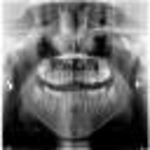

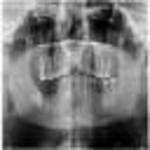

In [51]:
from PIL import Image as PILImage
import glob

def display_clear_images(image_paths, display_width, interpolation=PILImage.BICUBIC):
    for image_path in image_paths:
        img = PILImage.open(image_path)
        img_resized = img.resize((display_width, display_width), resample=interpolation)
        display(img_resized)

image_directory = '/content/Dentistry-2/train/images'

image_paths = glob.glob(f'{image_directory}/*.jpg')[:20]

display_clear_images(image_paths,150)


In [6]:
!pwd

/content


# ***Note***
Change this in data.yaml :

train: /content/Dentistry-2/train/images

val: /content/Dentistry-2/valid/images

```
# This is formatted as code
```



# ***Train***

In [9]:
!cd {home}
!yolo task=segment mode=train model=yolov8l-seg.pt data='/content/Dentistry-2/data.yaml' epochs=100 imgsz=640


100% 88.1M/88.1M [00:00<00:00, 190MB/s]
Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8l-seg.pt, data=/content/Dentistry-2/data.yaml, epochs=100, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_la

# ***Model Visiualization***

In [43]:
!ls {home}/runs/segment/train2/


args.yaml					    MaskF1_curve.png	 train_batch2612.jpg
BoxF1_curve.png					    MaskP_curve.png	 train_batch2.jpg
BoxP_curve.png					    MaskPR_curve.png	 val_batch0_labels.jpg
BoxPR_curve.png					    MaskR_curve.png	 val_batch0_pred.jpg
BoxR_curve.png					    results.csv		 val_batch1_labels.jpg
confusion_matrix_normalized.png			    results.png		 val_batch1_pred.jpg
confusion_matrix.png				    train_batch0.jpg	 val_batch2_labels.jpg
events.out.tfevents.1703765516.647b9e9b055a.3529.0  train_batch1.jpg	 val_batch2_pred.jpg
labels_correlogram.jpg				    train_batch2610.jpg  weights
labels.jpg					    train_batch2611.jpg


/content


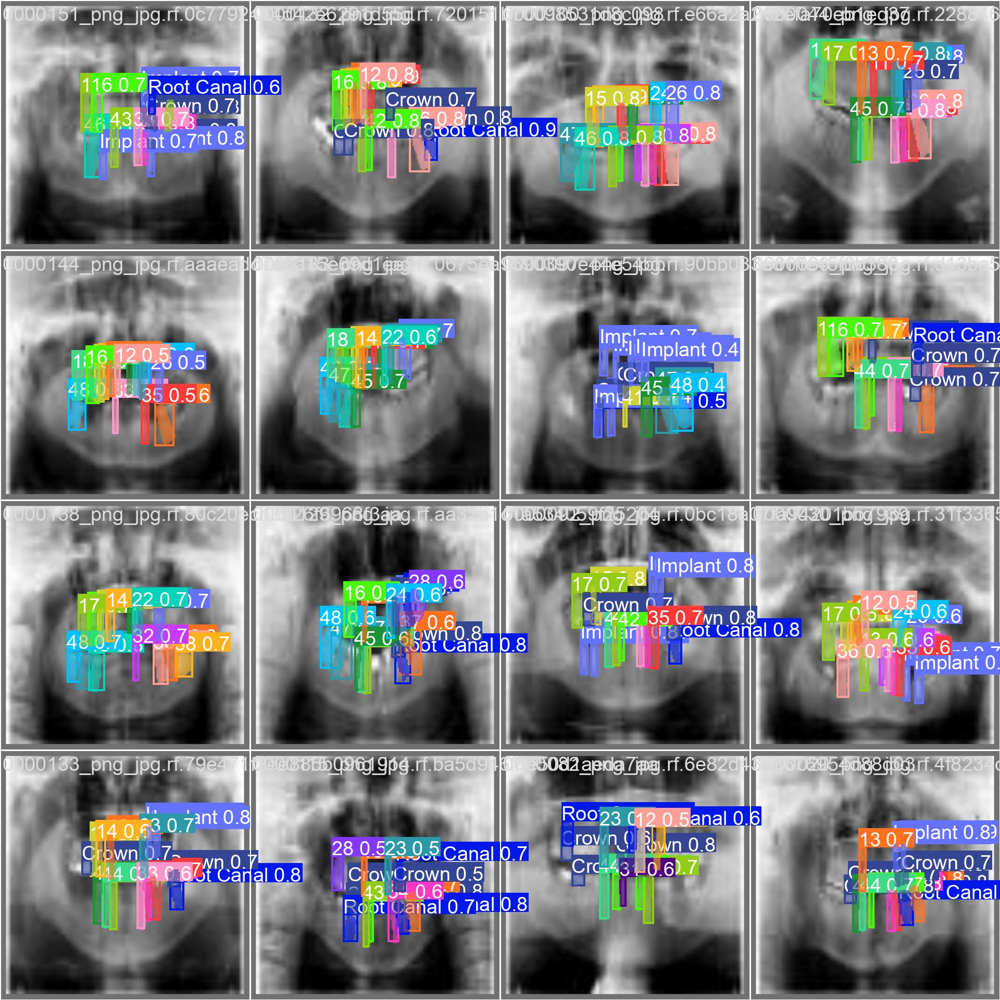

In [47]:
%cd {home}
Image(filename=f'{home}/runs/segment/train2/val_batch2_pred.jpg', width=1000)

/content


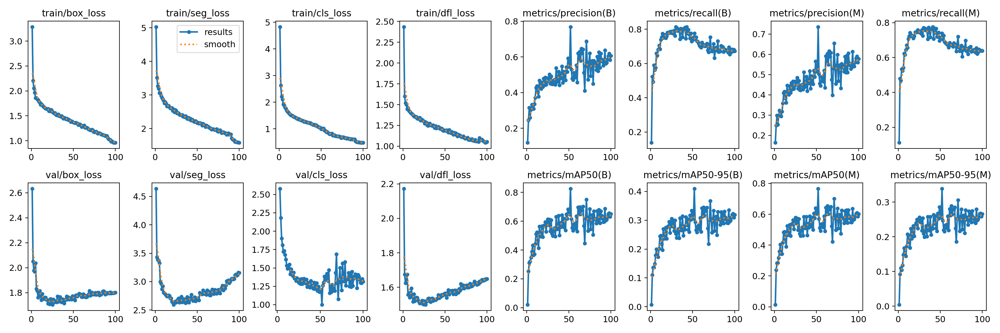

In [42]:
%cd {home}
Image(filename=f'{home}/runs/segment/train2/results.png', width=1000)

/content


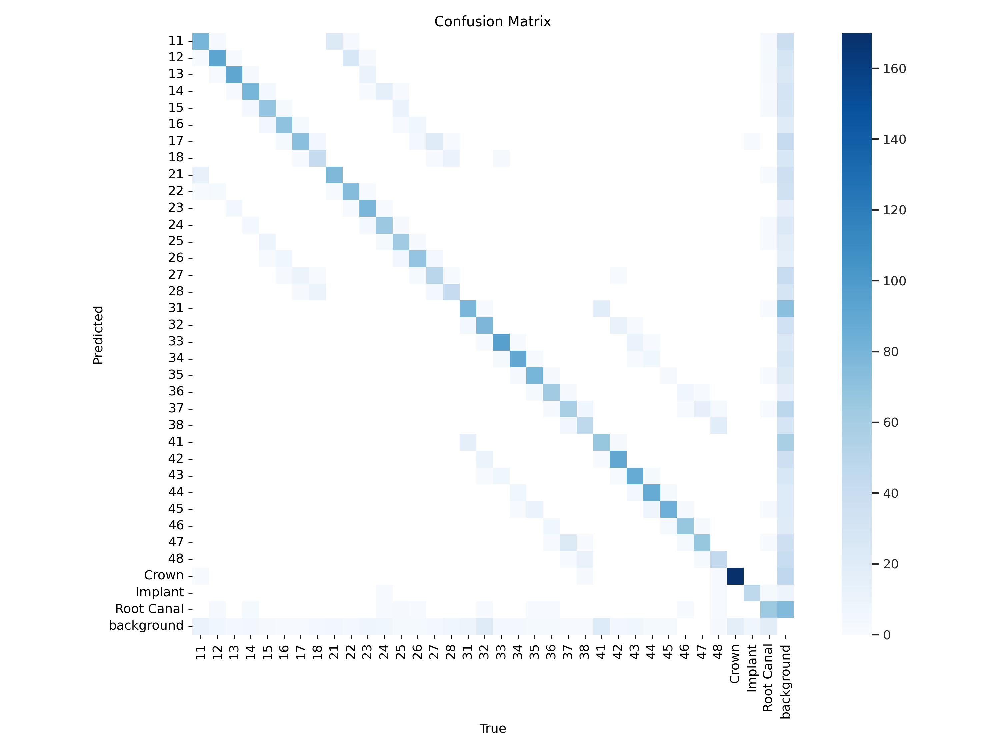

In [46]:
%cd {home}
Image(filename=f'{home}/runs/segment/train2/confusion_matrix.png', width=1000)

# ***Predict***

In [19]:
!cd {home}
!yolo task=segment mode=predict model=/content/runs/segment/train2/weights/best.pt source='/content/Dentistry-2/valid/images' conf =0.25


Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-seg summary (fused): 295 layers, 45938873 parameters, 0 gradients, 220.3 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/113 /content/Dentistry-2/valid/images/0000005_png_jpg.rf.27d5911503f69d2a54f96a156e3094d6.jpg: 640x640 2 11s, 2 12s, 3 13s, 2 14s, 2 15s, 2 16s, 1 17, 2 18s, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 2 31s, 1 32, 2 33s, 2 34s, 1 35, 1 36, 1 37, 1 41, 1 42, 2 43s, 1 44, 1 45, 1 46, 2 47s, 2 48s, 1 Crown, 1 Root Canal, 76.4ms
image 2/113 /content/Dentistry-2/valid/images/0000011_png_jpg.rf.2ade3169518f1bce12c0a976cf93a8c9.jpg: 640x640 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 2 27s, 2 28s, 1 31, 1 32, 1 33, 2 34s, 1 35, 1 36, 1 37, 1 38, 1 41, 1 42, 1 43, 1 44, 1 45, 1 46, 1 47, 1 48, 53.4ms
image 3/113 /content/Dentistry-2/valid/images/0000017_png_jpg.rf.1a57a2ec8a90de930bdc47910a29fc8b.jpg: 640x640 1 11, 1 12, 1 13, 2 14s, 1 15

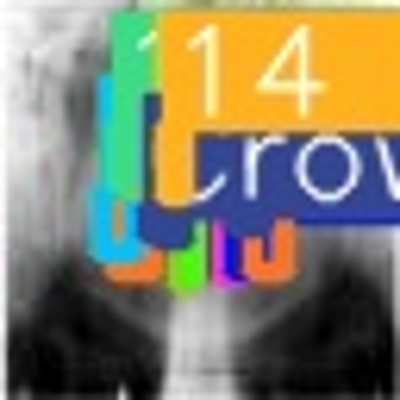

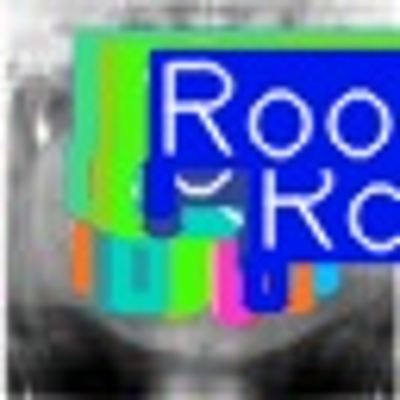

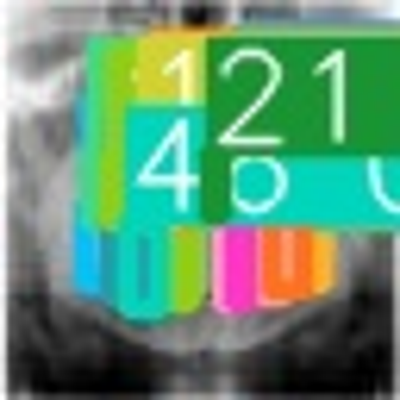

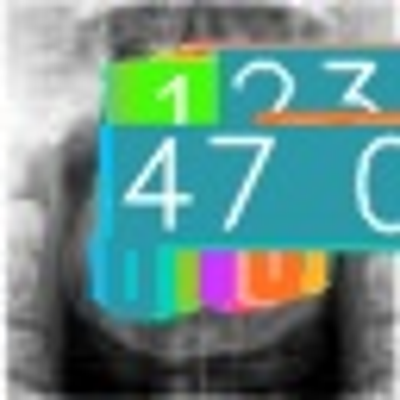

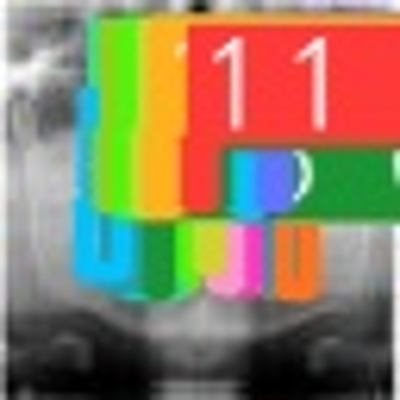

...

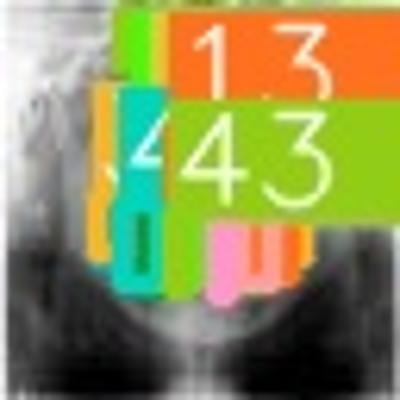

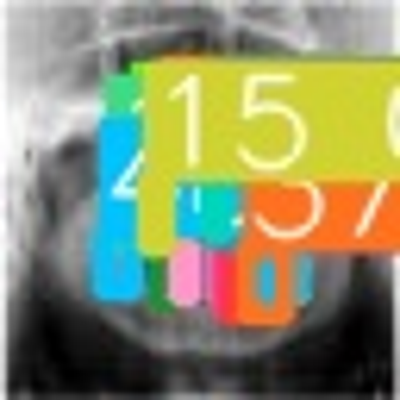

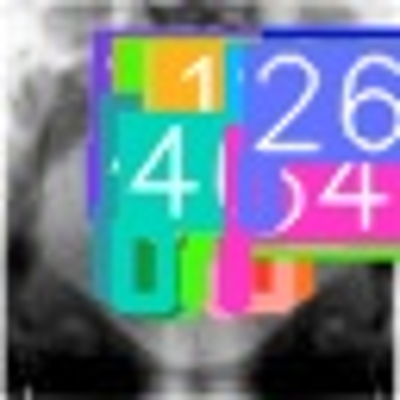

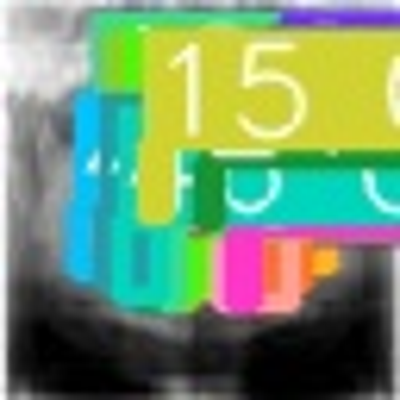

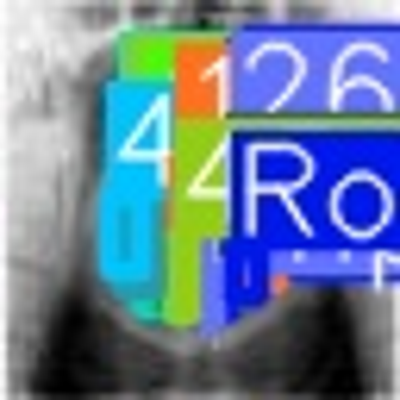

In [52]:
image_directory = '/content/runs/segment/predict5'

image_paths = glob.glob(f'{image_directory}/*.jpg')[:20]

display_clear_images(image_paths,400)


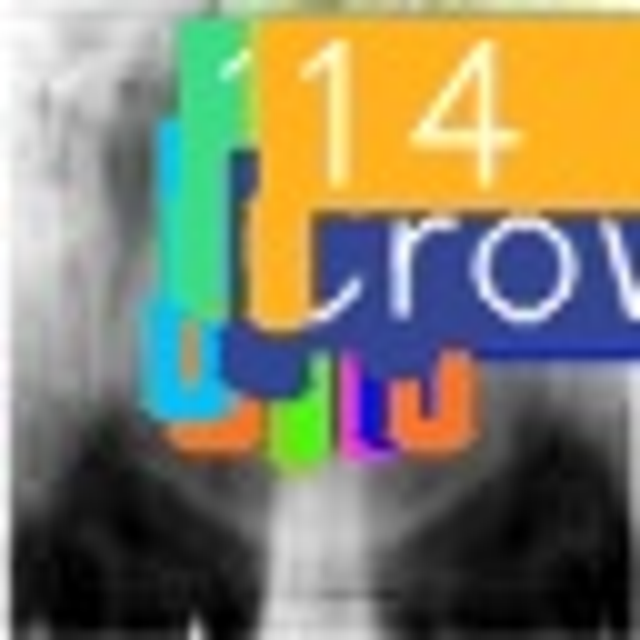

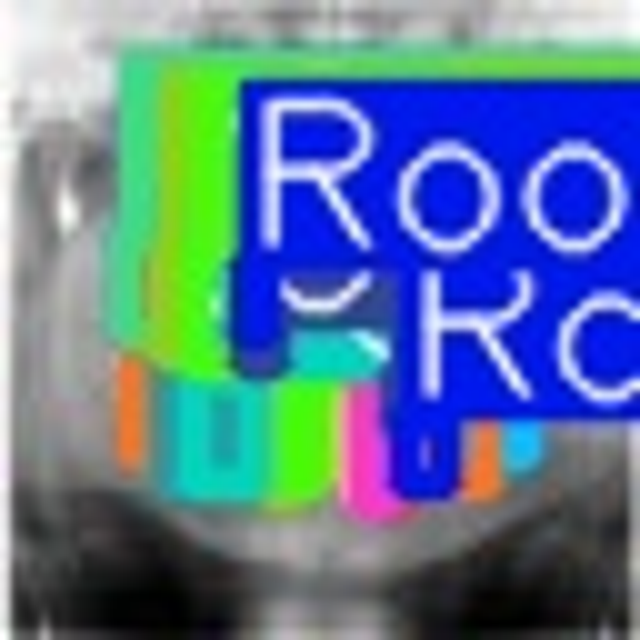

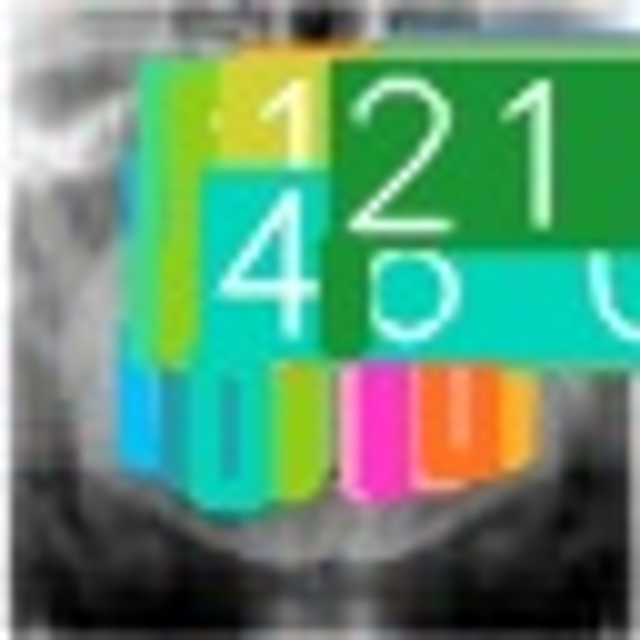

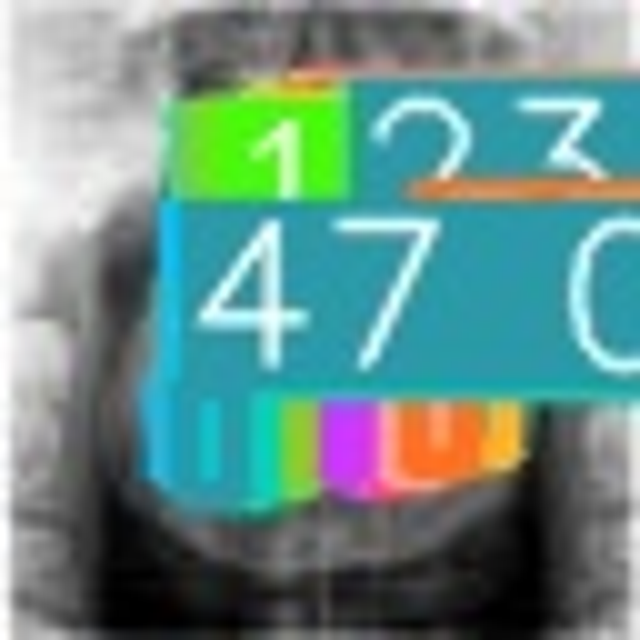

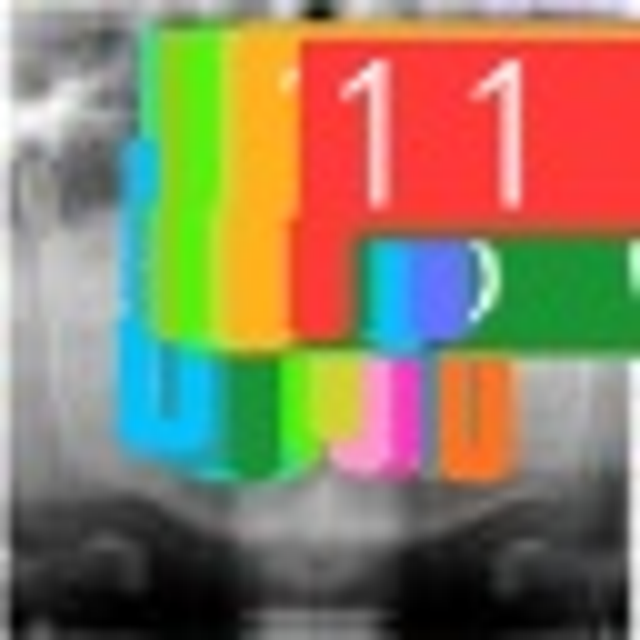

...

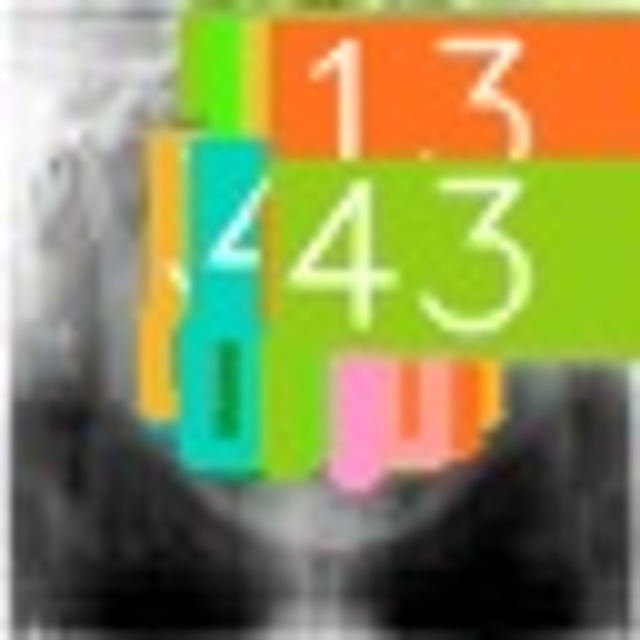

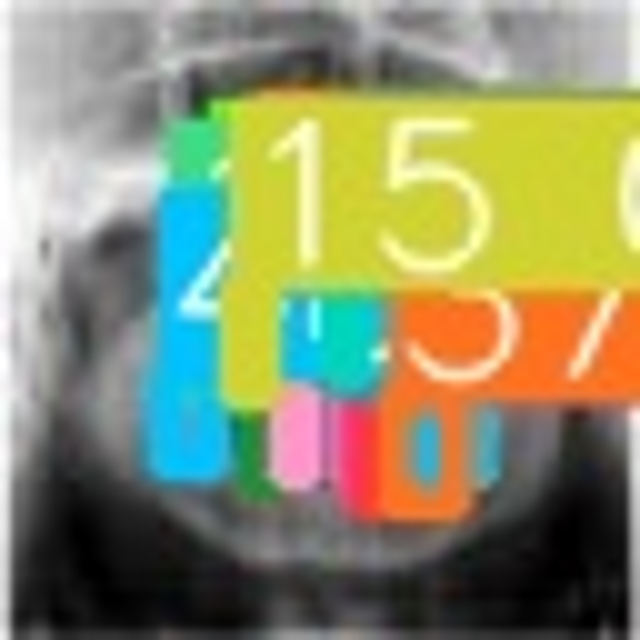

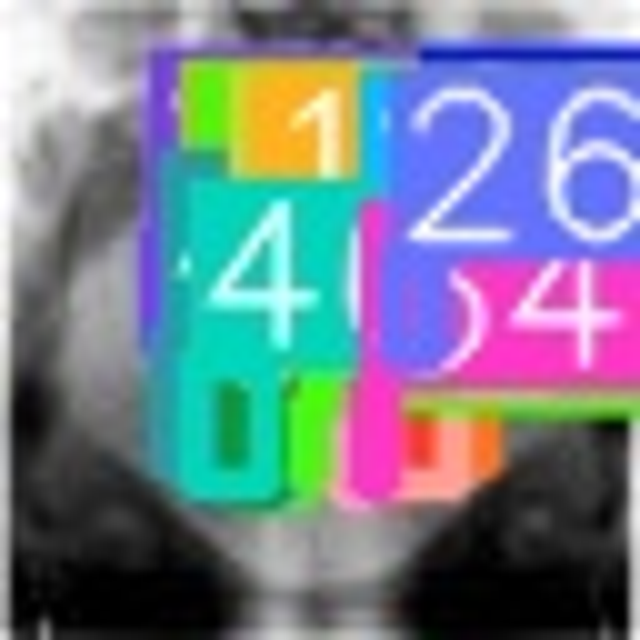

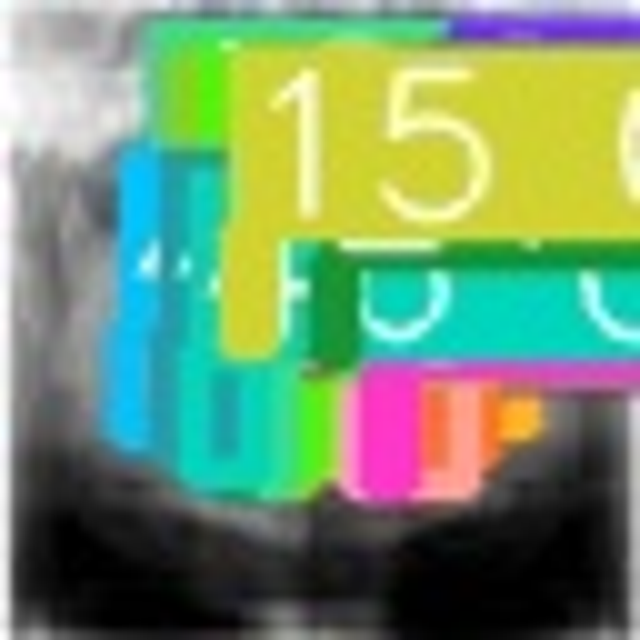

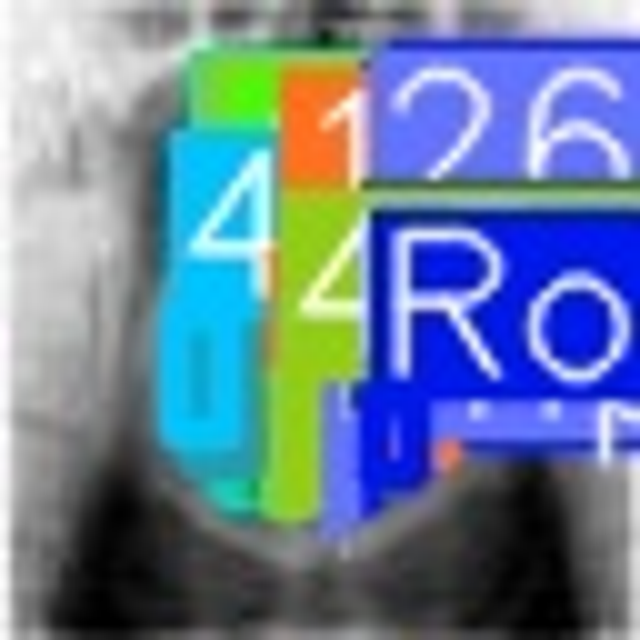

In [53]:

image_directory = '/content/runs/segment/predict5'

image_paths = glob.glob(f'{image_directory}/*.jpg')[:20]

display_clear_images(image_paths,640)
